# **PEMAIN SEPAK BOLA**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif

# Load Dataset

In [ ]:
df_fifa19 = pd.read_csv('/content/fifa_cleaned.csv')
df_fifa19

,id,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,club_jersey_number,club_join_date,contract_end_year,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,...,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,158023,L. Messi,Lionel Andrés Messi Cuccittini,1987-06-24,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Medium/ Low,Messi,226500000.0,FC Barcelona,86.0,RW,10.0,2004-07-01,2021,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,...,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,91+2,85+2,85+2,85+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,48+2,48+2,48+2,59+2
1,190460,C. Eriksen,Christian Dannemann Eriksen,1992-02-14,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,High/ Medium,Lean,133800000.0,Tottenham Hotspur,83.0,LCM,23.0,2013-08-30,2020,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,...,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79+3,79+3,79+3,85+3,84+3,84+3,84+3,85+3,86+3,86+3,86+3,86+3,85+3,85+3,85+3,86+3,71+3,71+3,71+3,71+3,71+3,66+3,57+3,57+3,57+3,66+3
2,195864,P. Pogba,Paul Pogba,1993-03-15,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,High/ Medium,Normal,144200000.0,Manchester United,82.0,LCM,6.0,2016-08-09,2021,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,...,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3
3,198219,L. Insigne,Lorenzo Insigne,1991-06-04,27,162.56,59.0,"LW,ST",Italy,88,88,62000000.0,165000.0,Right,3,4,4,High/ Medium,Normal,105400000.0,Napoli,82.0,LS,24.0,2010-07-01,2022,Italy,83.0,LW,10.0,86,77,56,85,74,90,87,77,78,93,...,83,87,61,83,51,24,22,8,4,14,9,10,"#Speedster,#Dribbler,#Crosser,#Acrobat","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",78+3,78+3,78+3,86+3,85+3,85+3,85+3,86+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,58+3,58+3,58+3,63+3,58+3,44+3,44+3,44+3,58+3
4,201024,K. Koulibaly,Kalidou Koulibaly,1991-06-20,27,187.96,88.9,CB,Senegal,88,91,60000000.0,135000.0,Right,3,3,2,High/ High,Normal,106500000.0,Napoli,82.0,LCB,26.0,2014-07-01,2021,NaN,NaN,NaN,NaN,30,22,83,68,14,69,28,28,60,63,...,24,49,33,80,91,88,87,7,11,7,13,5,"#Tackling ,#Tactician ,#Strength,#Complete Def...",Power Header,53+3,53+3,53+3,53+3,54+3,54+3,54+3,53+3,55+3,55+3,55+3,57+3,61+3,61+3,61+3,57+3,73+3,77+3,77+3,77+3,73+3,76+3,85+3,85+3,85+3,76+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17949,204322,R. McKenzie,Rory McKenzie,1993-10-07,25,175.26,74.8,"RM,CAM,CM",Scotland,67,70,975000.0,3000.0,Right,1,3,3,High/ Medium,Normal,1800000.0,Kilmarnock,67.0,SUB,7.0,2010-01-01,2020,NaN,NaN,NaN,NaN,57,61,60,66,37,64,53,47,61,66,...,60,64,63,56,40,20,18,15,11,15,12,7,#Acrobat,NaN,62+2,62+2,62+2,66+2,64+2,64+2,64+2,66+2,65+2,65+2,65+2,66+2,60+2,60+2,60+2,66+2,53+2,52+2,52+2,52+2

In [ ]:
df_fifa19.dtypes

id             int64
name          object
full_name     object
birth_date    object
age            int64
               ...  
LB            object
LCB           object
CB            object
RCB           object
RB            object
Length: 92, dtype: object

## **Penjelasan** Atribut yang digunakan:

*   id : atribut unik
*   overall_rating : penilaian kemampuan secara keseluruhan
*   club_rating : rating club pemain teresbut
*   crossing : kemampuan mengumpan bola
*   finishing : kemampuan untuk mencetak gol
*   heading_accuracy : keakuratan menyundul bola
*   short_passing : kemampuan umpan pendek
*   volleys : kemampuan melakukan tendangan volley
*   dribilng: kemampuan menggiring bola
*   curve: kemampuan tendangan melengkung
*   freekick_accuracy: keakuratan tendangan bebas
*   long_passing : kemampuan umpan jauh
*   ball_control : kemampuan mengontrol bola
*   acceleration : kemampuan akselerasi pemain
*   sprint_speed : kecepatan lari sprint
*   agility : kemampuan kelincahan pemain
*   reactions : kemampuan reaksi pemain
*   balance : kemampuan keseimbangan pemain
*   shot_power : kekuatan menendang bola
*   jumping : kemampuan melompat
*   stamina : stamina pemain
*   strength : kekuatan fisik pemain
*   long_shot : kemampuan tendangan jarak jauh pemain
*   aggresion : kemampuan keagresif-an pemain
*   interceptions : kemampuan untuk memotong bola
*   positioning : kemampuan menempatkan posisi
*   vision : kemampuan untuk melihat situasi
*   penalties : kemampuan tendangan pinalti
*   composure : kemampuan ketenangan pemain
*   marking : kemampuan untuk menandai pemain
*   standing_tackle : kemampuan menghalau bola saat berdiri
*   sliding_tackle : kemampuan menghalau bola saat meluncur
*   GK_diving : kemampuan kiper menangkis bola
*   GK_handling : kemampuan kiper untuk memegang bola
*   GK_kicking : kemampuan kiper menendang
*   GK_positioning : kemampuan posisi kiper
*   GK_reflexes : kemampuan releks kiper





















# Data Understanding (Statistik dan Visualisasi)

## Statistik

### Describe

Describe Dataset Pemain Sepak Bola

In [ ]:
#Describe Dataset
df_fifa19.describe()

,id,age,height_cm,weight_kgs,overall_rating,potential,value_euro,wage_euro,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),release_clause_euro,club_rating,club_jersey_number,national_rating,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes
count,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,1.769900e+04,17708.000000,17954.000000,17954.000000,17954.000000,1.611700e+04,17940.000000,17940.000000,857.000000,857.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000
mean,215411.087780,25.565445,174.946921,75.301047,66.240169,71.430935,2.479280e+06,9902.134628,1.111674,2.945695,2.361034,4.622522e+06,69.364158,20.297324,76.341890,12.456243,49.697672,45.358249,52.148212,58.566058,42.755208,55.278991,47.101147,42.688092,52.667428,58.223906,64.696224,64.803498,63.377465,61.821878,63.870057,55.319873,64.955219,63.133842,65.158850,46.852456,55.816531,46.657959,49.857302,53.406260,48.357302,58.680183,47.162861,47.733040,45.705915,16.784449,16.556199,16.388660,16.541049,16.874067
std,29758.387106,4.705708,14.029449,7.083684,6.963730,6.131339,5.687014e+06,21995.593750,0.392168,0.663691,0.763223,1.129077e+07,5.091678,16.464734,4.786667,8.098157,18.483310,19.640792,17.521819,14.863178,17.802936,19.091876,18.536621,17.565634,15.421545,16.875717,15.001345,14.722750,14.806946,9.075675,14.174038,17.351295,11.705711,15.917554,12.535955,19.429337,17.394047,20.754649,19.694311,14.156038,15.810844,11.625541,20.037346,21.674973,21.285812,17.893895,17.108234,16.701447,17.231495,18.182943
min,16.000000,17.000000,152.400000,49.900000,47.000000,48.000000,1.000000e+04,1000.000000,1.000000,1.000000,1.000000,1.300000e+04,54.000000,1.000000,63.000000,1.000000,5.000000,2.000000,4.000000,7.000000,3.000000,4.000000,6.000000,3.000000,9.000000,5.000000,12.000000,12.000000,11.000000,24.000000,16.000000,2.000000,15.000000,12.000000,20.000000,3.000000,11.000000,3.000000,2.000000,10.000000,5.000000,12.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,201117.250000,22.000000,154.940000,69.900000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.250000e+05,66.000000,9.000000,73.000000,6.000000,38.000000,30.000000,44.000000,53.000000,30.000000,49.000000,34.000000,30.000000,43.000000,54.000000,57.000000,58.000000,55.000000,56.000000,56.000000,45.000000,58.000000,56.000000,58.000000,32.000000,44.000000,26.000000,38.000000,44.000000,38.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,222919.000000,25.000000,175.260000,74.800000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,2.000000,1.200000e+06,69.000000,18.000000,75.000000,12.000000,54.000000,49.000000,56.000000,62.000000,44.000000,61.000000,49.000000,41.000000,56.000000,63.000000,67.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,66.000000,51.000000,59.000000,52.000000,55.000000,55.000000,49.000000,60.000000,52.500000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,237613.500000,29.000000,185.420000,79.800000,71.000000,75.000000,2.100000e+06,9000.000000,1.000000,3.000000,3.000000,3.500000e+06,72.000000,27.000000,81.000000,18.000000,64.000000,62.000000,64.000000,68.000000,5

Karena value pada atribut(overall_rating) mean dan STD(Standar Deviasi) berbeda cukup jauh, maka Data ini merupakan distribusi tidak normal.

In [ ]:
df_fifa19.describe(include="all")

,id,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,club_jersey_number,club_join_date,contract_end_year,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,...,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
count,17954.000000,17954,17954,17954,17954.000000,17954.000000,17954.000000,17954,17954,17954.000000,17954.000000,1.769900e+04,17708.000000,17954,17954.000000,17954.000000,17954.000000,17954,17954,1.611700e+04,17940,17940.000000,17940,17940.000000,16018,17593,857,857.000000,857,857.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,...,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,17954.000000,1417,8137,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889,15889
unique,NaN,16995,17898,6156,NaN,NaN,NaN,890,160,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,9,10,NaN,687,NaN,29,NaN,1731,24,103,NaN,29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81,1594,95,95,95,105,103,103,103,105,102,102,102,98,92,92,92,98,96,98,98,98,96,97,109,109,109,97
top,NaN,J. Rodríguez,Liam Kelly,1992-02-29,NaN,NaN,NaN,CB,England,NaN,NaN,NaN,NaN,Right,NaN,NaN,NaN,Medium/ Medium,Normal,NaN,FC Barcelona,NaN,SUB,NaN,2018-07-01,2021,Brazil,NaN,SUB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,#Strength,Speed Dribbler (CPU AI Only),61+2,61+2,61+2,63+2,60+2,60+2,60+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,61+2,62+2,62+2,62+2,61+2,64+2,63+2,63+2,63+2,64+2
freq,NaN,8,3,115,NaN,NaN,NaN,2243,1658,NaN,NaN,NaN,NaN,13781,NaN,NaN,NaN,9690,10393,NaN,33,NaN,7870,NaN,1423,4743,23,NaN,389,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,468,372,689,689,689,730,727,727,727,730,727,727,727,809,753,753,753,809,703,637,637,637,703,655,613,613,613,655
mean,215411.087780,NaN,NaN,NaN,25.565445,174.946921,75.301047,NaN,NaN,66.240169,71.430935,2.479280e+06,9902.134628,NaN,1.111674,2.945695,2.361034,NaN,NaN,4.622522e+06,NaN,69.364158,NaN,20.297324,NaN,NaN,NaN,76.341890,NaN,12.456243,49.697672,45.358249,52.148212,58.566058,42.755208,55.278991,47.101147,42.688092,52.667428,58.223906,...,49.857302,53.406260,48.357302,58.680183,47.162861,47.733040,45.705915,16.784449,16.556199,16.388660,16.541049,16.874067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,29758.387106,NaN,NaN,NaN,4.705708,14.029449,7.083684,NaN,NaN,6.963730,6.131339,5.687014e+06,21995.593750,NaN,0.392168,0.663691,0.763223,NaN,NaN,1.129077e+07,NaN,5.091678,NaN,16.464734,NaN,NaN,NaN,4.786667,NaN,8.098157,18.483310,19.640792,17.521819,14.863178,17.802936,19.091876,18.536621,17.565634,15.421545,16.875717,...,19.694311,14.156038,15.810844,11.625541,20.037346,21.674973,21.285812,17.893895,17.108234,16.701447,17.231495,18.182943,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,16.000000,NaN,NaN,NaN,17.000000,152.400000,49.900000,NaN,NaN,47.000000,48.000000,1.000000e+04,1000.000000,NaN,1.000000,1.000000,1.000000,NaN,NaN,1.300000e+04,NaN,54.000000,NaN,1.000000,NaN,NaN,NaN,63.000000,NaN,1.000000,5.000000,2.000000,4.000000,7.000000,3.000000,

### Korelasi

Korelasi hanya mengambil atribut yang berupa numerik (int64 atau float64)

In [ ]:
#Untuk menunjukan korelasi antar atribut
df_fifa19.corr()

,id,age,height_cm,weight_kgs,overall_rating,potential,value_euro,wage_euro,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),release_clause_euro,club_rating,club_jersey_number,national_rating,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes
id,1.000000,-0.745789,-0.060664,-0.193974,-0.421439,0.057837,-0.142762,-0.212280,-0.362582,-0.075384,-0.056325,-0.126422,-0.089428,0.182060,-0.113318,0.107566,-0.132995,-0.086259,-0.112367,-0.139352,-0.162162,-0.032953,-0.169884,-0.201446,-0.190822,-0.104260,0.134519,0.132401,-0.019936,-0.413291,0.046457,-0.167609,-0.174009,-0.056292,-0.268964,-0.168315,-0.230897,-0.162067,-0.090011,-0.216429,-0.147743,-0.386045,-0.117964,-0.086556,-0.069766,-0.103543,-0.108692,-0.105611,-0.116683,-0.103286
age,-0.745789,1.000000,0.059579,0.233819,0.461529,-0.259579,0.082360,0.152456,0.259977,0.061108,0.029681,0.064120,0.022919,-0.241511,0.026075,-0.122977,0.133357,0.074761,0.151723,0.137151,0.147752,0.016334,0.147628,0.196003,0.185018,0.091552,-0.151665,-0.144265,-0.013177,0.463421,-0.083610,0.158875,0.183816,0.103804,0.339671,0.164655,0.264859,0.198131,0.085510,0.193201,0.147924,0.394717,0.146725,0.118362,0.103008,0.100785,0.105334,0.104697,0.115960,0.102587
height_cm,-0.060664,0.059579,1.000000,0.495320,0.038080,0.008526,0.011144,0.021270,0.026850,-0.130464,-0.320141,0.011440,0.034744,-0.025676,0.090491,-0.067071,-0.388805,-0.296794,-0.043058,-0.290321,-0.279702,-0.382181,-0.345927,-0.316407,-0.262813,-0.328643,-0.406415,-0.350074,-0.438373,-0.020000,-0.532396,-0.239960,-0.052169,-0.254794,0.318769,-0.305601,-0.073996,-0.078730,-0.353380,-0.287254,-0.272134,-0.111849,-0.089783,-0.081452,-0.086093,0.295386,0.296296,0.291707,0.296131,0.296989
weight_kgs,-0.193974,0.233819,0.495320,1.000000,0.150521,-0.015099,0.044519,0.062045,0.085086,-0.128875,-0.353601,0.037207,0.063224,-0.084709,0.066107,-0.095061,-0.394145,-0.294710,0.027698,-0.291826,-0.263662,-0.414172,-0.347161,-0.305299,-0.260840,-0.339170,-0.481583,-0.413238,-0.533050,0.082796,-0.663188,-0.198428,0.005741,-0.232554,0.610431,-0.278552,0.021926,-0.034607,-0.355281,-0.282234,-0.251453,-0.044538,-0.057559,-0.056318,-0.065965,0.342368,0.341784,0.339684,0.343853,0.343440
overall_rating,-0.421439,0.461529,0.038080,0.150521,1.000000,0.647249,0.630928,0.577316,0.489416,0.216394,0.418718,0.614804,0.612173,-0.210828,0.733395,-0.104753,0.398343,0.342331,0.347670,0.506819,0.396922,0.378718,0.423890,0.400878,0.489998,0.464336,0.204853,0.218443,0.275260,0.855767,0.114667,0.445306,0.271008,0.368749,0.360725,0.429458,0.397072,0.322030,0.362116,0.506812,0.350902,0.729278,0.292538,0.254481,0.225466,-0.030501,-0.029850,-0.032884,-0.021115,-0.027478
potential,0.057837,-0.259579,0.008526,-0.015099,0.647249,1.000000,0.576341,0.484029,0.358874,0.167735,0.356241,0.583649,0.680011,0.002259,0.665328,-0.026349,0.244438,0.247552,0.204059,0.368106,0.255954,0.315429,0.278243,0.230355,0.322550,0.350662,0.239457,0.241553,0.225621,0.505011,0.143429,0.289157,0.106849,0.199151,0.077918,0.265326,0.170005,0.151946,0.247677,0.348179,0.226746,0.434113,0.162999,0.143927,0.129755,-0.060147,-0.060974,-0.064471,-0.058313,-0.058856
value_euro,-0.142762,0.082360,0.011144,0.044519,0.630928,0.576341,1.000000,0.856466,0.644610,0.167784,0.317427,0.994318,0.540529,-0.086939,0.586039,-0.088824,0.251093,0.261003,0.188190,0.329467,0.291412,0.273006,0.289540,0.268270,0.306941,0.309655,0.174608,0.176703,0.199008,0.547615,0.118869,0.284693,0.128507,0.216471,0.138230,0.284085,0.189101,0.142375,0.262596,0.363445,0.243599,0.456538,0.138085,0.110455,0.090450,-0.028961,-0.029126,-0.030189,-0.027929,-0.028677
wage_euro,-0.212280,0.152456,0.021270,0.0

Dari data atribut tersebut dapat diketahui atribut-atribut yang berkorelasi cukup tinggi(>0.8) adalah :
skill_moves(1-5),international_reputation(1-5),ball_control,crossing,short_passing,dribble,curve,finishing,volley,shot_power,long_shot,positioning,penalties,freekick_accuracy,acceleration,composure,club_rating,sprint_speed,agility,reaction,overall_rating,interceptions,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes

### Pencilan

Pencilan dengan menggunakan Tukey Fences (Distribusi tidak normal)

Interquartile range

In [ ]:
def outliers(df, feature):
    Q1= df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    upper_limit = Q3 + 1.5 * IQR
    lower_limit = Q1 - 1.5 * IQR
    return upper_limit, lower_limit

upper, lower = outliers(df_fifa19, "overall_rating")
print("Upper whisker: ", upper)
print("Lower Whisker: ", lower)

Upper whisker:  84.5
Lower Whisker:  48.5


Menampilkan banyaknya outlier

In [ ]:
df_fifa19[(df_fifa19['overall_rating'] < lower) | (df_fifa19['overall_rating'] > upper)]

,id,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,club_jersey_number,club_join_date,contract_end_year,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,...,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,158023,L. Messi,Lionel Andrés Messi Cuccittini,1987-06-24,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Medium/ Low,Messi,226500000.0,FC Barcelona,86.0,RW,10.0,2004-07-01,2021,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,...,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,91+2,85+2,85+2,85+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,48+2,48+2,48+2,59+2
1,190460,C. Eriksen,Christian Dannemann Eriksen,1992-02-14,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,High/ Medium,Lean,133800000.0,Tottenham Hotspur,83.0,LCM,23.0,2013-08-30,2020,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,...,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79+3,79+3,79+3,85+3,84+3,84+3,84+3,85+3,86+3,86+3,86+3,86+3,85+3,85+3,85+3,86+3,71+3,71+3,71+3,71+3,71+3,66+3,57+3,57+3,57+3,66+3
2,195864,P. Pogba,Paul Pogba,1993-03-15,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,High/ Medium,Normal,144200000.0,Manchester United,82.0,LCM,6.0,2016-08-09,2021,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,...,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3
3,198219,L. Insigne,Lorenzo Insigne,1991-06-04,27,162.56,59.0,"LW,ST",Italy,88,88,62000000.0,165000.0,Right,3,4,4,High/ Medium,Normal,105400000.0,Napoli,82.0,LS,24.0,2010-07-01,2022,Italy,83.0,LW,10.0,86,77,56,85,74,90,87,77,78,93,...,83,87,61,83,51,24,22,8,4,14,9,10,"#Speedster,#Dribbler,#Crosser,#Acrobat","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",78+3,78+3,78+3,86+3,85+3,85+3,85+3,86+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,58+3,58+3,58+3,63+3,58+3,44+3,44+3,44+3,58+3
4,201024,K. Koulibaly,Kalidou Koulibaly,1991-06-20,27,187.96,88.9,CB,Senegal,88,91,60000000.0,135000.0,Right,3,3,2,High/ High,Normal,106500000.0,Napoli,82.0,LCB,26.0,2014-07-01,2021,NaN,NaN,NaN,NaN,30,22,83,68,14,69,28,28,60,63,...,24,49,33,80,91,88,87,7,11,7,13,5,"#Tackling ,#Tactician ,#Strength,#Complete Def...",Power Header,53+3,53+3,53+3,53+3,54+3,54+3,54+3,53+3,55+3,55+3,55+3,57+3,61+3,61+3,61+3,57+3,73+3,77+3,77+3,77+3,73+3,76+3,85+3,85+3,85+3,76+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17940,183277,E. Hazard,Eden Hazard,1991-01-07,28,172.72,76.2,"LW,CF",Belgium,91,91,93000000.0,340000.0,Right,4,4,4,High/ Medium,Normal,172100000.0,Chelsea,83.0,LW,10.0,2012-07-01,2020,Belgium,85.0,LF,10.0,81,84,61,89,80,95,83,79,83,94,...,87,89,86,91,34,27,22,11,12,6,8,8,"#Speedster,#Dribbler,#Acrobat","Beat Offside Trap,Finesse Shot,Flair,Playmaker...",83+3,83+3,83+3,89+3,88+3,88+3,8

Menghapus outlier dari dataset

In [ ]:
new_df = df_fifa19[(df_fifa19['overall_rating'] > lower) & (df_fifa19['overall_rating'] < upper)]

Sebelum hapus outlier

In [ ]:
df_fifa19.shape

(17954, 92)

Sesudah hapus outlier

In [ ]:
new_df.shape

(17792, 92)

## Visualisasi

**Visualisasi Outlier dengan Boxplot**

Sebelum hapus outlier

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


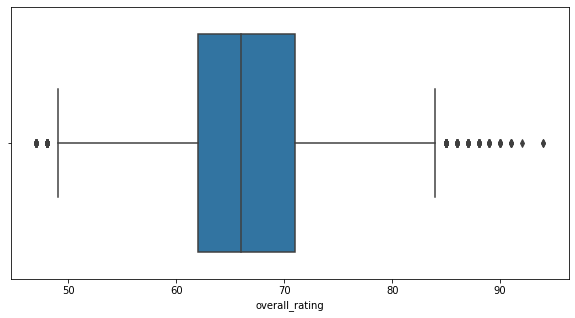

In [ ]:
plt.figure(figsize=(10,5))
sns.boxplot(df_fifa19['overall_rating'])

Setelah hapus outlier

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


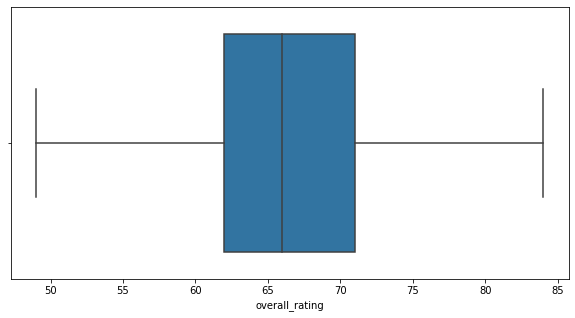

In [ ]:
plt.figure(figsize=(10,5))
sns.boxplot(new_df['overall_rating'])

# Data Preparation (Sebelum Hapus Outlier)

## Cleansing

In [ ]:
df_fifa19

,id,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,club_jersey_number,club_join_date,contract_end_year,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,...,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,158023,L. Messi,Lionel Andrés Messi Cuccittini,1987-06-24,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Medium/ Low,Messi,226500000.0,FC Barcelona,86.0,RW,10.0,2004-07-01,2021,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,...,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,91+2,85+2,85+2,85+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,48+2,48+2,48+2,59+2
1,190460,C. Eriksen,Christian Dannemann Eriksen,1992-02-14,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,High/ Medium,Lean,133800000.0,Tottenham Hotspur,83.0,LCM,23.0,2013-08-30,2020,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,...,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79+3,79+3,79+3,85+3,84+3,84+3,84+3,85+3,86+3,86+3,86+3,86+3,85+3,85+3,85+3,86+3,71+3,71+3,71+3,71+3,71+3,66+3,57+3,57+3,57+3,66+3
2,195864,P. Pogba,Paul Pogba,1993-03-15,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,High/ Medium,Normal,144200000.0,Manchester United,82.0,LCM,6.0,2016-08-09,2021,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,...,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3
3,198219,L. Insigne,Lorenzo Insigne,1991-06-04,27,162.56,59.0,"LW,ST",Italy,88,88,62000000.0,165000.0,Right,3,4,4,High/ Medium,Normal,105400000.0,Napoli,82.0,LS,24.0,2010-07-01,2022,Italy,83.0,LW,10.0,86,77,56,85,74,90,87,77,78,93,...,83,87,61,83,51,24,22,8,4,14,9,10,"#Speedster,#Dribbler,#Crosser,#Acrobat","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",78+3,78+3,78+3,86+3,85+3,85+3,85+3,86+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,58+3,58+3,58+3,63+3,58+3,44+3,44+3,44+3,58+3
4,201024,K. Koulibaly,Kalidou Koulibaly,1991-06-20,27,187.96,88.9,CB,Senegal,88,91,60000000.0,135000.0,Right,3,3,2,High/ High,Normal,106500000.0,Napoli,82.0,LCB,26.0,2014-07-01,2021,NaN,NaN,NaN,NaN,30,22,83,68,14,69,28,28,60,63,...,24,49,33,80,91,88,87,7,11,7,13,5,"#Tackling ,#Tactician ,#Strength,#Complete Def...",Power Header,53+3,53+3,53+3,53+3,54+3,54+3,54+3,53+3,55+3,55+3,55+3,57+3,61+3,61+3,61+3,57+3,73+3,77+3,77+3,77+3,73+3,76+3,85+3,85+3,85+3,76+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17949,204322,R. McKenzie,Rory McKenzie,1993-10-07,25,175.26,74.8,"RM,CAM,CM",Scotland,67,70,975000.0,3000.0,Right,1,3,3,High/ Medium,Normal,1800000.0,Kilmarnock,67.0,SUB,7.0,2010-01-01,2020,NaN,NaN,NaN,NaN,57,61,60,66,37,64,53,47,61,66,...,60,64,63,56,40,20,18,15,11,15,12,7,#Acrobat,NaN,62+2,62+2,62+2,66+2,64+2,64+2,64+2,66+2,65+2,65+2,65+2,66+2,60+2,60+2,60+2,66+2,53+2,52+2,52+2,52+2

### Menghapus Kolom yang tidak dibutuhkan

In [ ]:
drop_kolom = ['name','birth_date','height_cm','weight_kgs','value_euro','wage_euro','positions','potential','preferred_foot','work_rate','body_type','release_clause_euro','club_jersey_number','club_join_date','contract_end_year','national_team','national_rating','national_team_position','national_jersey_number','tags','traits','LS','ST','RS','LW','LAM','CAM','RAM','LM','LCM','CM','RCM','RM','LWB','LDM','CDM','RDM','RWB','LB','LCB','CB','RCB','RB','LF','CF','RF','RW']
df_fifa19.drop(drop_kolom, inplace=True, axis=1)

In [ ]:
df_fifa19.shape

(17954, 45)

Mengecek apakah masih ada data yang Null

In [ ]:
df_fifa19.isnull().sum()

id                                0
full_name                         0
age                               0
nationality                       0
overall_rating                    0
international_reputation(1-5)     0
weak_foot(1-5)                    0
skill_moves(1-5)                  0
club_team                        14
club_rating                      14
club_position                    14
crossing                          0
finishing                         0
heading_accuracy                  0
short_passing                     0
volleys                           0
dribbling                         0
curve                             0
freekick_accuracy                 0
long_passing                      0
ball_control                      0
acceleration                      0
sprint_speed                      0
agility                           0
reactions                         0
balance                           0
shot_power                        0
jumping                     

In [ ]:
df_fifa19.dtypes

id                                 int64
full_name                         object
age                                int64
nationality                       object
overall_rating                     int64
international_reputation(1-5)      int64
weak_foot(1-5)                     int64
skill_moves(1-5)                   int64
club_team                         object
club_rating                      float64
club_position                     object
crossing                           int64
finishing                          int64
heading_accuracy                   int64
short_passing                      int64
volleys                            int64
dribbling                          int64
curve                              int64
freekick_accuracy                  int64
long_passing                       int64
ball_control                       int64
acceleration                       int64
sprint_speed                       int64
agility                            int64
reactions       

Mengecek atribut 'id' adalah unique

In [ ]:
df_fifa19['id'].is_unique

True

### Melakukan Replace pada data

Replace data dengan tipe data "object"

In [ ]:
#input data for missing value 
df_fifa19['club_team'].fillna('No Club', inplace = True)
df_fifa19['club_position'].fillna('ST', inplace = True)

In [ ]:
df_fifa19.isnull().sum()

id                                0
full_name                         0
age                               0
nationality                       0
overall_rating                    0
international_reputation(1-5)     0
weak_foot(1-5)                    0
skill_moves(1-5)                  0
club_team                         0
club_rating                      14
club_position                     0
crossing                          0
finishing                         0
heading_accuracy                  0
short_passing                     0
volleys                           0
dribbling                         0
curve                             0
freekick_accuracy                 0
long_passing                      0
ball_control                      0
acceleration                      0
sprint_speed                      0
agility                           0
reactions                         0
balance                           0
shot_power                        0
jumping                     

### Mengisi data

In [ ]:
#replace data NULL pada club_rating lalu diisi dengan mean club_rating
input_rata2 = df_fifa19.loc[:, ['club_rating']] 
for i in input_rata2.columns:
    df_fifa19[i].fillna(df_fifa19[i].mean(), inplace = True)

In [ ]:
df_fifa19.isnull().sum()

id                               0
full_name                        0
age                              0
nationality                      0
overall_rating                   0
international_reputation(1-5)    0
weak_foot(1-5)                   0
skill_moves(1-5)                 0
club_team                        0
club_rating                      0
club_position                    0
crossing                         0
finishing                        0
heading_accuracy                 0
short_passing                    0
volleys                          0
dribbling                        0
curve                            0
freekick_accuracy                0
long_passing                     0
ball_control                     0
acceleration                     0
sprint_speed                     0
agility                          0
reactions                        0
balance                          0
shot_power                       0
jumping                          0
stamina             

In [ ]:
df_fifa19.head(50)

,id,full_name,age,nationality,overall_rating,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),club_team,club_rating,club_position,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes
0,158023,Lionel Andrés Messi Cuccittini,31,Argentina,94,5,4,4,FC Barcelona,86.0,RW,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8
1,190460,Christian Dannemann Eriksen,27,Denmark,88,3,5,4,Tottenham Hotspur,83.0,LCM,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6
2,195864,Paul Pogba,25,France,88,4,4,5,Manchester United,82.0,LCM,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3
3,198219,Lorenzo Insigne,27,Italy,88,3,4,4,Napoli,82.0,LS,86,77,56,85,74,90,87,77,78,93,94,86,94,83,93,75,53,75,44,84,34,26,83,87,61,83,51,24,22,8,4,14,9,10
4,201024,Kalidou Koulibaly,27,Senegal,88,3,3,2,Napoli,82.0,LCB,30,22,83,68,14,69,28,28,60,63,70,75,50,82,40,55,81,75,94,15,87,88,24,49,33,80,91,88,87,7,11,7,13,5
5,203376,Virgil van Dijk,27,Netherlands,88,3,3,2,Liverpool,83.0,LCB,53,52,83,79,45,70,60,70,81,76,74,77,61,87,49,81,88,75,92,64,82,88,41,60,62,87,90,89,84,13,10,13,11,11
6,231747,Kylian Mbappé,20,France,88,3,4,5,Paris Saint-Germain,84.0,LS,77,88,77,82,78,90,77,63,73,91,96,96,92,87,83,79,75,83,71,78,62,38,88,82,70,86,34,34,32,13,5,7,11,6
7,153079,Sergio Leonel Agüero del Castillo,30,Argentina,89,4,4,4,Manchester City,85.0,ST,70,93,77,81,85,89,82,73,64,89,88,80,86,90,91,88,81,76,73,83,65,24,92,83,83,90,30,20,12,13,15,6,11,14
8,167495,Manuel Neuer,32,Germany,89,5,4,1,FC Bayern München,85.0,GK,15,13,25,55,11,30,14,11,59,46,54,60,51,84,35,25,77,43,80,16,29,30,12,70,47,70,17,10,11,90,86,91,87,87
9,179813,Edinson Roberto Cavani Gómez,32,Uruguay,89,4,4,3,Paris Saint-Germain,84.0,RS,70,89,89,78,90,80,77,76,52,82,75,76,77,91,59,87,88,92,78,79,84,48,93,77,85,82,52,45,39,12,5,13,13,10


## Selecting

X = 10 atribut dari data yang ada

y = yang dipilih overall_rating

In [ ]:
df_fifa1 = df_fifa19[['id','international_reputation(1-5)', 'weak_foot(1-5)', 'skill_moves(1-5)', 'club_rating', 
            'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys', 'dribbling', 'curve', 'freekick_accuracy', 
            'long_passing', 'ball_control', 'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 
            'strength', 'long_shots', 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'marking', 'standing_tackle', 
            'sliding_tackle', 'GK_diving', 'GK_handling', 'GK_kicking', 'GK_positioning', 'GK_reflexes', 'overall_rating']]
df_fifa1.head()

,id,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),club_rating,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,overall_rating
0,158023,5,4,4,86.0,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,94
1,190460,3,5,4,83.0,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6,88
2,195864,4,4,5,82.0,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3,88
3,198219,3,4,4,82.0,86,77,56,85,74,90,87,77,78,93,94,86,94,83,93,75,53,75,44,84,34,26,83,87,61,83,51,24,22,8,4,14,9,10,88
4,201024,3,3,2,82.0,30,22,83,68,14,69,28,28,60,63,70,75,50,82,40,55,81,75,94,15,87,88,24,49,33,80,91,88,87,7,11,7,13,5,88


In [ ]:
df_fifa1.shape

(17954, 40)

### Dengan Chi2

In [ ]:
X=df_fifa1.iloc[:, 1:39]
y=df_fifa1.iloc[:, -1]

bestfeatures=SelectKBest(score_func=chi2, k=10)
fit=bestfeatures.fit(X,y)
score=pd.DataFrame(fit.scores_)
column=pd.DataFrame(X.columns)

fiturScore=pd.concat([column,score], axis=1)

#pemberian nama
fiturScore.columns=['Fitur','Score']

print(fiturScore.nlargest(10,'Score'))


                Fitur         Score
23         long_shots  27387.997138
10              curve  23997.236080
29          composure  22095.459664
11  freekick_accuracy  21374.439491
8             volleys  21291.122023
4            crossing  20355.064308
19         shot_power  19928.993685
12       long_passing  19823.643284
13       ball_control  19463.481039
26        positioning  18896.922021


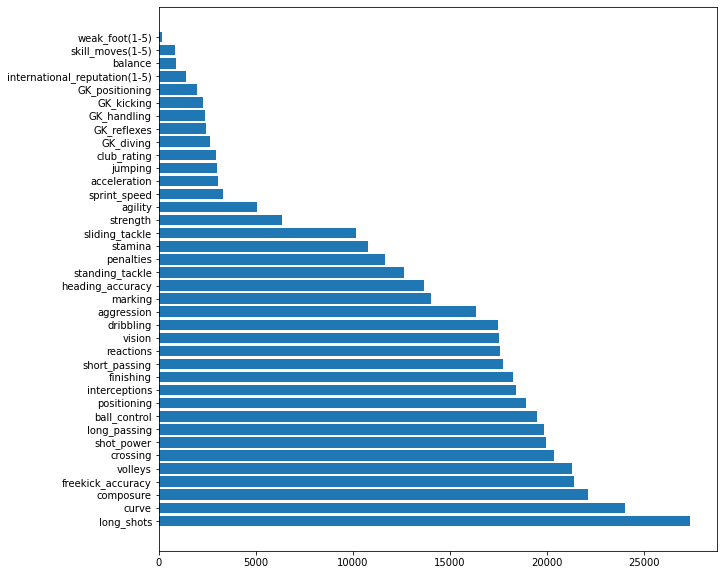

In [ ]:
plt.figure(figsize=(10,10))
fiturScore.sort_values(by='Score', ascending=False, inplace=True)
plt.barh(np.arange(len(fiturScore['Fitur'])), fiturScore['Score'], tick_label=fiturScore['Fitur'])
plt.show()

Dengan Metode Chi square, diperoleh data bahwa, **long_shots**, **curve**, dan **composure** adalah data tertinggi

### Dengan ANOVA

In [ ]:
X=df_fifa1.iloc[:, 1:39]
y=df_fifa1.iloc[:, -1]

bestfeatures=SelectKBest(score_func=f_classif, k=10)
fit=bestfeatures.fit(X,y)
score=pd.DataFrame(fit.scores_)
column=pd.DataFrame(X.columns)

fiturScore=pd.concat([column,score], axis=1)

#pemberian nama
fiturScore.columns=['Fitur','Score']

print(fiturScore.nlargest(10,'Score'))

                            Fitur        Score
17                      reactions  1079.745450
0   international_reputation(1-5)   484.487192
29                      composure   446.727362
3                     club_rating   306.615751
7                   short_passing   138.053712
27                         vision   136.695088
12                   long_passing   126.002964
13                   ball_control   110.853217
19                     shot_power    99.747294
23                     long_shots    90.921220


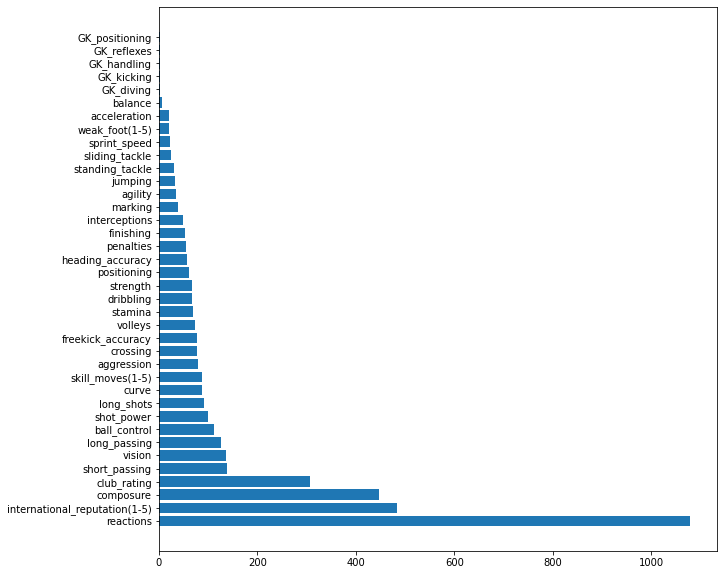

In [ ]:
plt.figure(figsize=(10,10))
fiturScore.sort_values(by='Score', ascending=False, inplace=True)
plt.barh(np.arange(len(fiturScore['Fitur'])), fiturScore['Score'], tick_label=fiturScore['Fitur'])
plt.show()

Dengan Metode ANOVA, diperoleh data bahwa, **reactions**, **international_reputation(1-5)**, dan **composure** adalah data tertinggi

### Feature Importance

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
bestfeatures=ExtraTreesClassifier()
bestfeatures.fit(X,y)

print(bestfeatures.feature_importances_)

[0.00558551 0.01798245 0.01063612 0.03220199 0.02738437 0.02740547
 0.02910096 0.0300094  0.02477134 0.02981267 0.02393172 0.0235904
 0.02585098 0.03492143 0.02439566 0.0248831  0.0239405  0.03985911
 0.02313148 0.02649478 0.02401304 0.02644186 0.0261396  0.0255797
 0.02606487 0.03107156 0.02947618 0.02612066 0.02357348 0.0309212
 0.03016812 0.0316509  0.02932212 0.02725175 0.02677154 0.02459975
 0.02766064 0.02728357]


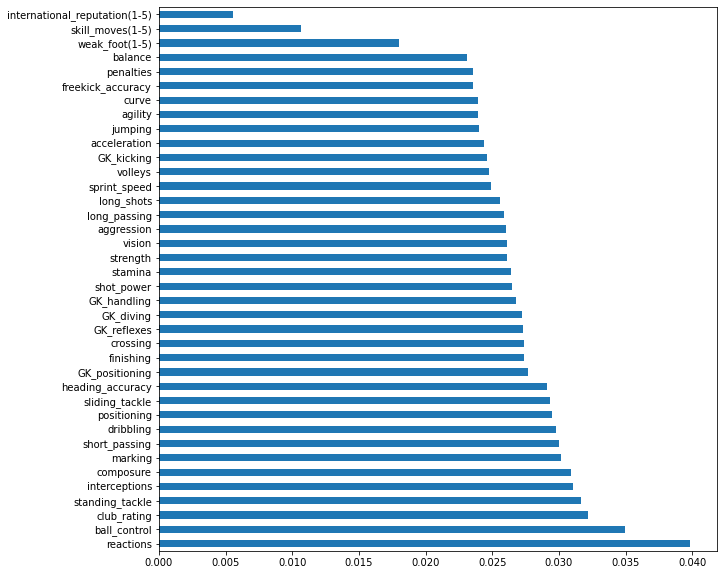

In [ ]:
plt.figure(figsize=(10,10))
feature_importance=pd.Series(bestfeatures.feature_importances_,index=X.columns)
feature_importance.nlargest(len(bestfeatures.feature_importances_)).plot(kind='barh')

Dengan Metode Feature Importance, diperoleh data bahwa, **reactions**, **ball_control**, dan **standing_tackle** adalah data tertinggi

### Heatmap Correlation

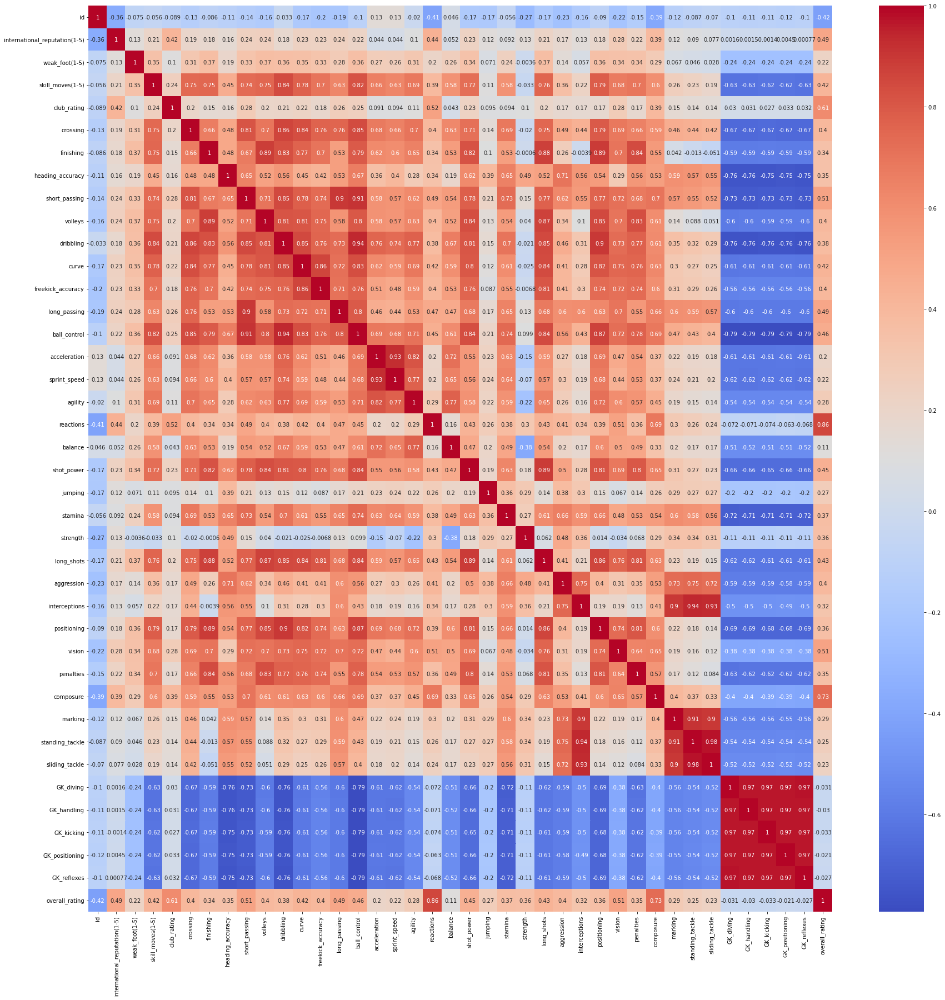

In [ ]:
fig, ax = plt.subplots(figsize = (30,30))
sns.heatmap(df_fifa1.corr(), cmap='coolwarm', annot=True);

Dengan Metode Heatmap Correlation, diperoleh data bahwa, **reactions**, **composure**, dan **club_rating** adalah data tertinggi

# Data Preparation (Sesudah Hapus Outlier)

## Cleansing

In [ ]:
new_df.head()

,id,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,club_jersey_number,club_join_date,contract_end_year,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,...,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
32,206585,Kepa,Kepa Arrizabalaga,1994-10-03,24,185.42,84.8,GK,Spain,84,90,31000000.0,92000.0,Right,1,4,1,Medium/ Medium,Lean,63600000.0,Chelsea,83.0,GK,1.0,2018-08-08,2025,Spain,85.0,SUB,13.0,25,11,17,32,18,10,25,19,36,16,...,15,55,24,63,19,18,16,84,82,79,80,85,NaN,"GK Long Throw,Comes For Crosses,Saves with Feet",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,208670,H. Ziyech,Hakim Ziyech,1993-03-19,25,154.94,64.9,"CAM,RW",Morocco,84,86,38000000.0,31000.0,Left,3,2,4,High/ High,Lean,56100000.0,Ajax,78.0,RAM,22.0,2016-08-30,2021,NaN,NaN,NaN,NaN,84,68,53,86,77,84,90,78,89,83,...,76,88,72,83,52,66,36,11,7,11,8,14,"#Playmaker ,#Engine,#Acrobat,#Complete Midfie...","Flair,Long Passer (CPU AI Only),Long Shot Take...",74+3,74+3,74+3,80+3,79+3,79+3,79+3,80+3,82+3,82+3,82+3,81+3,82+3,82+3,82+3,81+3,71+3,72+3,72+3,72+3,71+3,67+3,60+3,60+3,60+3,67+3
34,209499,Fabinho,Fábio Henrique Tavares,1993-10-23,25,187.96,78.0,CDM,Brazil,84,88,34000000.0,120000.0,Right,3,2,3,Medium/ High,Lean,65500000.0,Liverpool,83.0,LDM,3.0,2018-07-01,2023,NaN,NaN,NaN,NaN,79,66,75,83,47,76,71,53,80,82,...,70,77,91,84,84,86,84,13,12,6,8,8,NaN,"Injury Free,Long Passer (CPU AI Only)",73+3,73+3,73+3,75+3,75+3,75+3,75+3,75+3,76+3,76+3,76+3,77+3,80+3,80+3,80+3,77+3,82+3,83+3,83+3,83+3,82+3,82+3,82+3,82+3,82+3,82+3
35,211300,A. Martial,Anthony Martial,1995-12-05,23,182.88,76.2,"LW,ST,LM",France,84,90,42500000.0,165000.0,Right,3,3,4,Medium/ Medium,Normal,89300000.0,Manchester United,82.0,LW,11.0,2015-09-01,2024,NaN,NaN,NaN,NaN,76,84,69,78,74,88,84,54,60,87,...,83,74,81,82,34,39,36,9,8,8,15,11,#Dribbler,"Beat Offside Trap,Finesse Shot,Flair,Speed Dri...",82+3,82+3,82+3,83+3,83+3,83+3,83+3,83+3,81+3,81+3,81+3,81+3,74+3,74+3,74+3,81+3,64+3,60+3,60+3,60+3,64+3,61+3,54+3,54+3,54+3,61+3
36,212188,T. Werner,Timo Werner,1996-03-06,23,154.94,74.8,ST,Germany,84,87,40000000.0,77000.0,Right,3,4,3,High/ Medium,Normal,71000000.0,RB Leipzig,79.0,LS,11.0,2016-07-01,2020,Germany,85.0,RW,9.0,69,87,77,77,85,83,63,56,55,84,...,85,61,72,74,39,20,19,9,9,8,15,9,#Speedster,"Diver,Beat Offside Trap,Speed Dribbler (CPU AI...",82+3,82+3,82+3,81+3,81+3,81+3,81+3,81+3,78+3,78+3,78+3,80+3,70+3,70+3,70+3,80+3,61+3,55+3,55+3,55+3,61+3,57+3,49+3,49+3,49+3,57+3


### Menghapus Kolom yang tidak dibutuhkan

In [ ]:
drop_kolom = ['name','birth_date','height_cm','weight_kgs','value_euro','wage_euro','positions',
              'potential','preferred_foot','work_rate','body_type','release_clause_euro','club_jersey_number',
              'club_join_date','contract_end_year','national_team','national_rating','national_team_position',
              'national_jersey_number','tags','traits','LS','ST','RS','LW','LAM','CAM','RAM','LM','LCM','CM','RCM',
              'RM','LWB','LDM','CDM','RDM','RWB','LB','LCB','CB','RCB','RB','LF','CF','RF','RW']
new_df.drop(drop_kolom, inplace=True, axis=1)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
new_df.head()

,id,full_name,age,nationality,overall_rating,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),club_team,club_rating,club_position,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes
32,206585,Kepa Arrizabalaga,24,Spain,84,1,4,1,Chelsea,83.0,GK,25,11,17,32,18,10,25,19,36,16,34,33,41,79,39,25,71,37,51,14,18,21,15,55,24,63,19,18,16,84,82,79,80,85
33,208670,Hakim Ziyech,25,Morocco,84,3,2,4,Ajax,78.0,RAM,84,68,53,86,77,84,90,78,89,83,76,74,86,83,78,80,38,86,59,76,72,62,76,88,72,83,52,66,36,11,7,11,8,14
34,209499,Fábio Henrique Tavares,25,Brazil,84,3,2,3,Liverpool,83.0,LDM,79,66,75,83,47,76,71,53,80,82,69,72,69,83,67,78,75,92,79,65,85,84,70,77,91,84,84,86,84,13,12,6,8,8
35,211300,Anthony Martial,23,France,84,3,3,4,Manchester United,82.0,LW,76,84,69,78,74,88,84,54,60,87,88,89,85,82,81,84,74,76,75,80,58,42,83,74,81,82,34,39,36,9,8,8,15,11
36,212188,Timo Werner,23,Germany,84,3,4,3,RB Leipzig,79.0,LS,69,87,77,77,85,83,63,56,55,84,93,93,81,86,76,78,78,83,64,70,63,37,85,61,72,74,39,20,19,9,9,8,15,9


In [ ]:
new_df.shape

(17792, 45)

Mengecek apakah masih ada data yang Null

In [ ]:
new_df.isnull().sum()

id                                0
full_name                         0
age                               0
nationality                       0
overall_rating                    0
international_reputation(1-5)     0
weak_foot(1-5)                    0
skill_moves(1-5)                  0
club_team                        14
club_rating                      14
club_position                    14
crossing                          0
finishing                         0
heading_accuracy                  0
short_passing                     0
volleys                           0
dribbling                         0
curve                             0
freekick_accuracy                 0
long_passing                      0
ball_control                      0
acceleration                      0
sprint_speed                      0
agility                           0
reactions                         0
balance                           0
shot_power                        0
jumping                     

In [ ]:
new_df.dtypes

id                                 int64
full_name                         object
age                                int64
nationality                       object
overall_rating                     int64
international_reputation(1-5)      int64
weak_foot(1-5)                     int64
skill_moves(1-5)                   int64
club_team                         object
club_rating                      float64
club_position                     object
crossing                           int64
finishing                          int64
heading_accuracy                   int64
short_passing                      int64
volleys                            int64
dribbling                          int64
curve                              int64
freekick_accuracy                  int64
long_passing                       int64
ball_control                       int64
acceleration                       int64
sprint_speed                       int64
agility                            int64
reactions       

Mengecek atribut 'id' adalah unique

In [ ]:
new_df['id'].is_unique

True

### Melakukan Replace pada data

Replace data dengan tipe data "object"

In [ ]:
#input data for missing value 
new_df['club_team'].fillna('No Club', inplace = True)
new_df['club_position'].fillna('ST', inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


In [ ]:
new_df.isnull().sum()

id                                0
full_name                         0
age                               0
nationality                       0
overall_rating                    0
international_reputation(1-5)     0
weak_foot(1-5)                    0
skill_moves(1-5)                  0
club_team                         0
club_rating                      14
club_position                     0
crossing                          0
finishing                         0
heading_accuracy                  0
short_passing                     0
volleys                           0
dribbling                         0
curve                             0
freekick_accuracy                 0
long_passing                      0
ball_control                      0
acceleration                      0
sprint_speed                      0
agility                           0
reactions                         0
balance                           0
shot_power                        0
jumping                     

### Mengisi data

In [ ]:
#replace data NULL pada club_rating lalu diisi dengan mean club_rating
input_rata2 = new_df.loc[:, ['club_rating']] 
for i in input_rata2.columns:
    new_df[i].fillna(new_df[i].mean(), inplace = True)

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4536: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


In [ ]:
new_df.isnull().sum()

id                               0
full_name                        0
age                              0
nationality                      0
overall_rating                   0
international_reputation(1-5)    0
weak_foot(1-5)                   0
skill_moves(1-5)                 0
club_team                        0
club_rating                      0
club_position                    0
crossing                         0
finishing                        0
heading_accuracy                 0
short_passing                    0
volleys                          0
dribbling                        0
curve                            0
freekick_accuracy                0
long_passing                     0
ball_control                     0
acceleration                     0
sprint_speed                     0
agility                          0
reactions                        0
balance                          0
shot_power                       0
jumping                          0
stamina             

In [ ]:
new_df.head(50)

,id,full_name,age,nationality,overall_rating,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),club_team,club_rating,club_position,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes
32,206585,Kepa Arrizabalaga,24,Spain,84,1,4,1,Chelsea,83.0,GK,25,11,17,32,18,10,25,19,36,16,34,33,41,79,39,25,71,37,51,14,18,21,15,55,24,63,19,18,16,84,82,79,80,85
33,208670,Hakim Ziyech,25,Morocco,84,3,2,4,Ajax,78.0,RAM,84,68,53,86,77,84,90,78,89,83,76,74,86,83,78,80,38,86,59,76,72,62,76,88,72,83,52,66,36,11,7,11,8,14
34,209499,Fábio Henrique Tavares,25,Brazil,84,3,2,3,Liverpool,83.0,LDM,79,66,75,83,47,76,71,53,80,82,69,72,69,83,67,78,75,92,79,65,85,84,70,77,91,84,84,86,84,13,12,6,8,8
35,211300,Anthony Martial,23,France,84,3,3,4,Manchester United,82.0,LW,76,84,69,78,74,88,84,54,60,87,88,89,85,82,81,84,74,76,75,80,58,42,83,74,81,82,34,39,36,9,8,8,15,11
36,212188,Timo Werner,23,Germany,84,3,4,3,RB Leipzig,79.0,LS,69,87,77,77,85,83,63,56,55,84,93,93,81,86,76,78,78,83,64,70,63,37,85,61,72,74,39,20,19,9,9,8,15,9
37,212190,Niklas Süle,23,Germany,84,2,3,2,FC Bayern München,85.0,RCB,30,20,86,78,31,42,28,30,63,63,52,84,33,79,33,77,38,65,94,62,82,82,26,30,32,72,83,85,83,15,7,14,7,15
38,212198,Bruno Miguel Borges Fernandes,24,Portugal,84,2,3,4,Portugal,82.0,SUB,84,74,58,85,84,83,86,85,84,86,79,76,77,84,78,87,72,91,67,88,66,71,81,86,82,84,66,66,57,12,14,15,8,14
39,212462,Alex Nicolao Telles,26,Brazil,84,3,2,3,FC Porto,81.0,LB,89,65,74,83,67,82,87,79,86,82,84,85,73,83,70,80,81,92,68,75,78,80,76,74,73,80,80,81,79,13,8,12,11,14
40,216460,José María Giménez de Vargas,24,Uruguay,84,2,3,2,Atlético Madrid,84.0,RCB,47,37,81,68,30,47,36,44,58,56,69,70,56,76,43,72,90,67,85,48,89,85,24,27,38,73,88,86,87,9,11,7,10,15
41,216594,Nabil Fekir,25,France,84,3,3,4,Olympique Lyonnais,79.0,CAM,83,82,49,83,77,90,81,79,75,89,79,79,84,80,91,84,69,77,82,82,73,28,81,81,76,89,31,37,25,15,9,8,14,15


## Selecting

X = Dari semua atribut yang ada

y = yang dipilih overall_rating

In [ ]:
new_df1 = new_df[['id','international_reputation(1-5)', 'weak_foot(1-5)', 'skill_moves(1-5)', 'club_rating', 
            'crossing', 'finishing', 'heading_accuracy', 'short_passing', 'volleys', 'dribbling', 'curve', 'freekick_accuracy', 
            'long_passing', 'ball_control', 'acceleration', 'sprint_speed', 'agility', 'reactions', 'balance', 'shot_power', 'jumping', 'stamina', 
            'strength', 'long_shots', 'aggression', 'interceptions', 'positioning', 'vision', 'penalties', 'composure', 'marking', 'standing_tackle', 
            'sliding_tackle', 'GK_diving', 'GK_handling', 'GK_kicking', 'GK_positioning', 'GK_reflexes', 'overall_rating']]
new_df1.head()

,id,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),club_rating,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,overall_rating
32,206585,1,4,1,83.0,25,11,17,32,18,10,25,19,36,16,34,33,41,79,39,25,71,37,51,14,18,21,15,55,24,63,19,18,16,84,82,79,80,85,84
33,208670,3,2,4,78.0,84,68,53,86,77,84,90,78,89,83,76,74,86,83,78,80,38,86,59,76,72,62,76,88,72,83,52,66,36,11,7,11,8,14,84
34,209499,3,2,3,83.0,79,66,75,83,47,76,71,53,80,82,69,72,69,83,67,78,75,92,79,65,85,84,70,77,91,84,84,86,84,13,12,6,8,8,84
35,211300,3,3,4,82.0,76,84,69,78,74,88,84,54,60,87,88,89,85,82,81,84,74,76,75,80,58,42,83,74,81,82,34,39,36,9,8,8,15,11,84
36,212188,3,4,3,79.0,69,87,77,77,85,83,63,56,55,84,93,93,81,86,76,78,78,83,64,70,63,37,85,61,72,74,39,20,19,9,9,8,15,9,84


In [ ]:
new_df1.shape

(17792, 40)

### Dengan Chi2

In [ ]:
X=new_df1.iloc[:, 1:39]
y=new_df1.iloc[:, -1]

bestfeatures=SelectKBest(score_func=chi2, k=10)
fit=bestfeatures.fit(X,y)
score=pd.DataFrame(fit.scores_)
column=pd.DataFrame(X.columns)

fiturScore=pd.concat([column,score], axis=1)

#pemberian nama
fiturScore.columns=['Fitur','Score']

print(fiturScore.nlargest(10,'Score'))


                Fitur         Score
23         long_shots  26010.873115
10              curve  22661.905838
29          composure  20635.221980
11  freekick_accuracy  20124.138799
8             volleys  19860.094688
4            crossing  19317.662153
19         shot_power  19030.502217
12       long_passing  18659.781548
13       ball_control  18311.189569
26        positioning  17754.737496


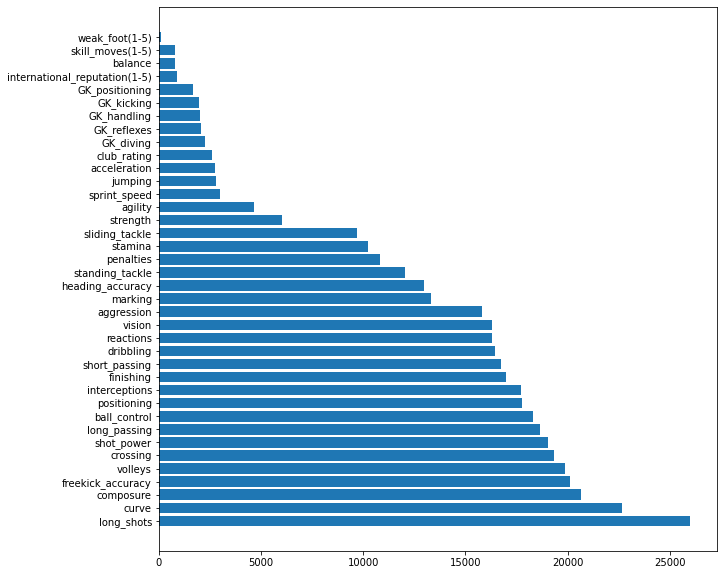

In [ ]:
plt.figure(figsize=(10,10))
fiturScore.sort_values(by='Score', ascending=False, inplace=True)
plt.barh(np.arange(len(fiturScore['Fitur'])), fiturScore['Score'], tick_label=fiturScore['Fitur'])
plt.show()

Dengan Metode Chi square, diperoleh data bahwa, **long_shots**, **curve**, dan **composure** adalah data tertinggi

### Dengan ANOVA

In [ ]:
X=new_df1.iloc[:, 1:39]
y=new_df1.iloc[:, -1]

bestfeatures=SelectKBest(score_func=f_classif, k=10)
fit=bestfeatures.fit(X,y)
score=pd.DataFrame(fit.scores_)
column=pd.DataFrame(X.columns)

fiturScore=pd.concat([column,score], axis=1)

#pemberian nama
fiturScore.columns=['Fitur','Score']

print(fiturScore.nlargest(10,'Score'))

                            Fitur        Score
17                      reactions  1313.973609
29                      composure   546.168512
0   international_reputation(1-5)   410.204628
3                     club_rating   354.781170
7                   short_passing   171.432433
27                         vision   167.371593
12                   long_passing   155.793390
13                   ball_control   137.575733
19                     shot_power   125.399226
23                     long_shots   113.799575


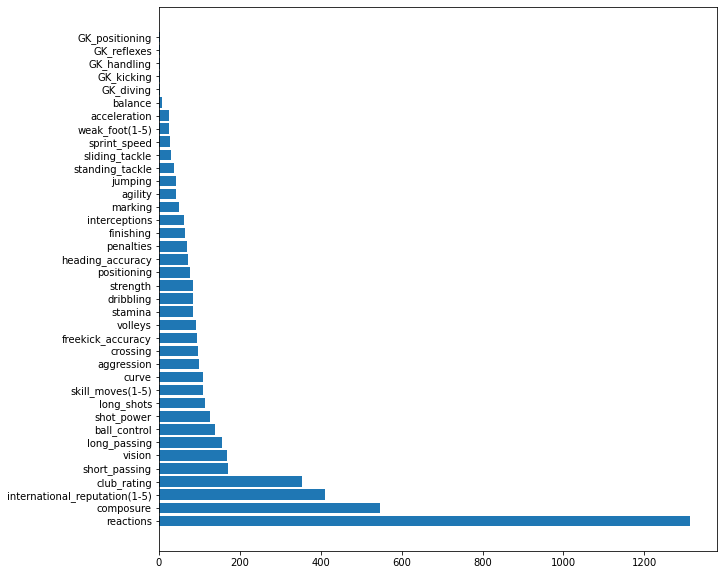

In [ ]:
plt.figure(figsize=(10,10))
fiturScore.sort_values(by='Score', ascending=False, inplace=True)
plt.barh(np.arange(len(fiturScore['Fitur'])), fiturScore['Score'], tick_label=fiturScore['Fitur'])
plt.show()

Dengan Metode ANOVA, diperoleh data bahwa, **reactions**, **composure**, **international_reputation(1-5)**, dan **club_rating** adalah data tertinggi

### Feature Importance

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
bestfeatures=ExtraTreesClassifier()
bestfeatures.fit(X,y)

print(bestfeatures.feature_importances_)

[0.00532473 0.01799113 0.0105811  0.03156086 0.02716151 0.02716107
 0.02839824 0.0295114  0.02465313 0.02946105 0.02442224 0.0238156
 0.02584761 0.03463019 0.02465432 0.02481528 0.02382415 0.04064646
 0.02304751 0.02690523 0.02388532 0.02654437 0.0264715  0.0256445
 0.02619175 0.0315144  0.02915101 0.02620802 0.02351381 0.03078177
 0.03036636 0.03230677 0.02909567 0.02723799 0.02715939 0.02440984
 0.02763557 0.02746913]


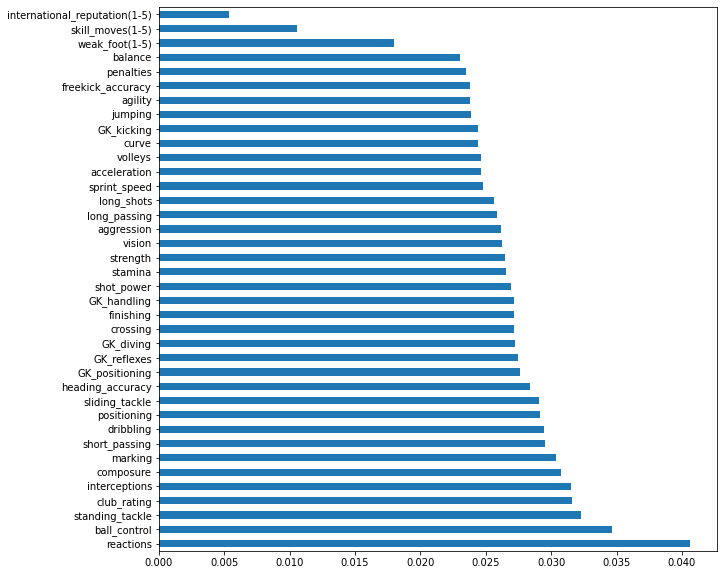

In [ ]:
plt.figure(figsize=(10,10))
feature_importance=pd.Series(bestfeatures.feature_importances_,index=X.columns)
feature_importance.nlargest(len(bestfeatures.feature_importances_)).plot(kind='barh')

Dengan Metode Feature Importance, diperoleh data bahwa, **reactions**, **ball_control**, dan **standing_tackle** adalah data tertinggi

### Heatmap Correlation

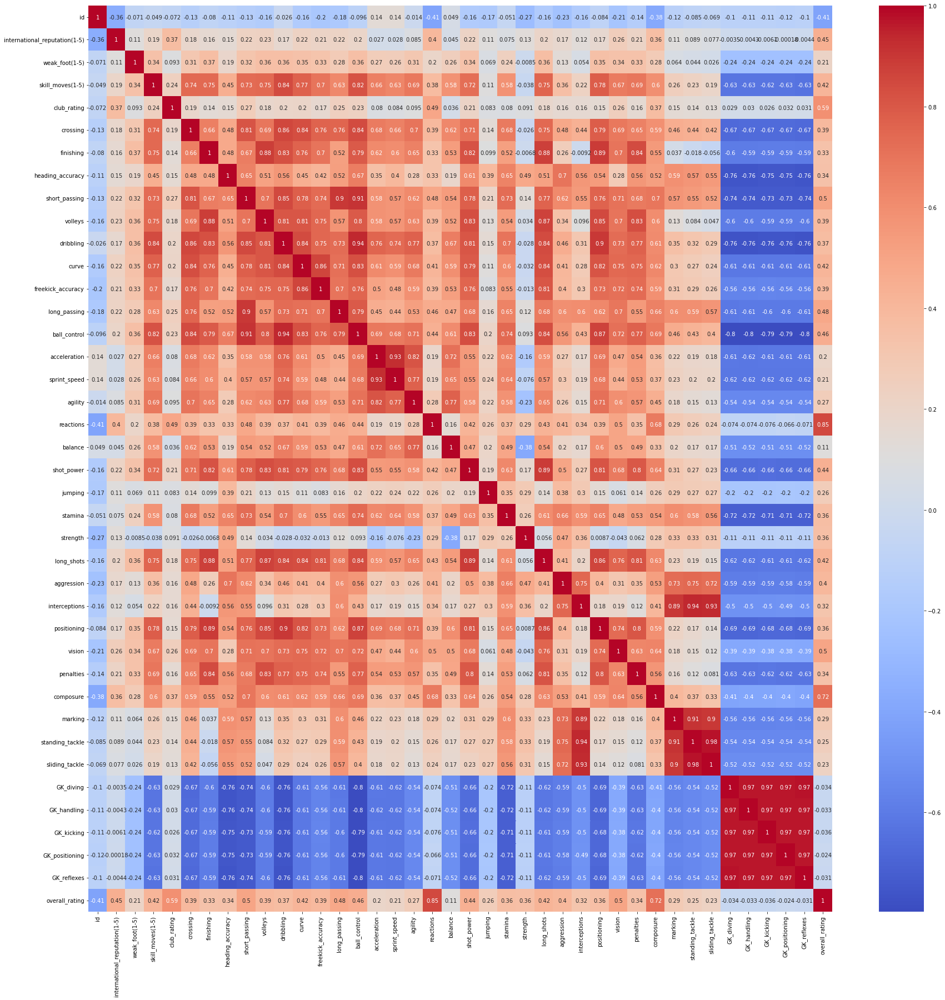

In [ ]:
fig, ax = plt.subplots(figsize = (30,30))
sns.heatmap(new_df1.corr(), cmap='coolwarm', annot=True);

Dengan Metode Heatmap Correlation, diperoleh data bahwa, **reactions**, **composure**, dan **club_rating** adalah data tertinggi

# Modeling

Setelah selection, didapatkan 3 atribut yang beririsan yaitu **reactions**, **composure**, dan **club rating**

In [ ]:
data = new_df1[['id','reactions','composure','club_rating','overall_rating']]
data.head()

,id,reactions,composure,club_rating,overall_rating
32,206585,79,63,83.0,84
33,208670,83,83,78.0,84
34,209499,83,84,83.0,84
35,211300,82,82,82.0,84
36,212188,86,74,79.0,84


## Visualisasi (Untuk melihat sebaran data)

Reactions - Overall Rating

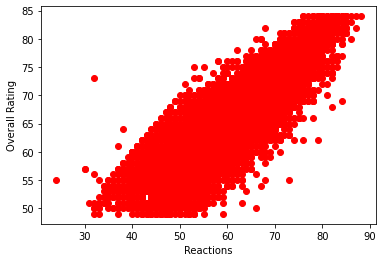

In [ ]:
plt.scatter(data['reactions'],data['overall_rating'],color='red')
plt.xlabel("Reactions")
plt.ylabel("Overall Rating")
plt.show()

Composure - Overall Rating

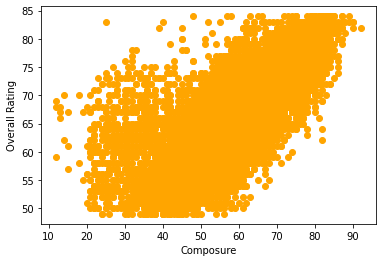

In [ ]:
plt.scatter(data['composure'],data['overall_rating'],color='orange')
plt.xlabel("Composure")
plt.ylabel("Overall Rating")
plt.show()

Club Rating - Overall Rating

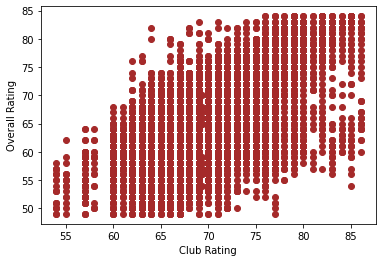

In [ ]:
plt.scatter(data['club_rating'],data['overall_rating'],color='brown')
plt.xlabel("Club Rating")
plt.ylabel("Overall Rating")
plt.show()

## Membagi menjadi X dan Y

In [ ]:
X=data.iloc[:, 1:4].values
print(X)

[[79. 63. 83.]
 [83. 83. 78.]
 [83. 84. 83.]
 ...
 [48. 47. 69.]
 [53. 53. 74.]
 [54. 45. 71.]]


In [ ]:
y=data.iloc[:, 4].values
print(y)

[84 84 84 ... 59 59 59]


## Scaling - Normalization

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_scaled_minmax=scaler.fit_transform(X)
X_scaled_minmax

array([[0.859375, 0.6375  , 0.90625 ],
       [0.921875, 0.8875  , 0.75    ],
       [0.921875, 0.9     , 0.90625 ],
       ...,
       [0.375   , 0.4375  , 0.46875 ],
       [0.453125, 0.5125  , 0.625   ],
       [0.46875 , 0.4125  , 0.53125 ]])

In [ ]:
#reshape diperlukan untuk mengubah 1d array menjadi 2d array
y = y.reshape(-1,1)
y_scaled_minmax=scaler.fit_transform(y)
print(y_scaled_minmax)

[[1.        ]
 [1.        ]
 [1.        ]
 ...
 [0.28571429]
 [0.28571429]
 [0.28571429]]


### Visualisasi Sebaran setelah di Normalisasi

Reactions - Overall Rating

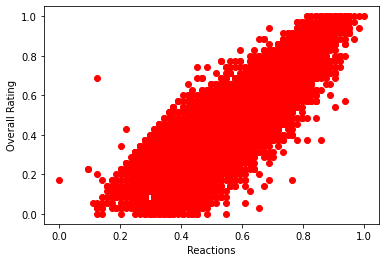

In [ ]:
plt.scatter(X_scaled_minmax[:, 0],y_scaled_minmax,color='red')
plt.xlabel("Reactions")
plt.ylabel("Overall Rating")
plt.show()

Composure - Overall Rating

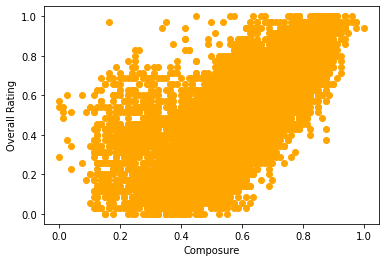

In [ ]:
plt.scatter(X_scaled_minmax[:, 1],y_scaled_minmax,color='orange')
plt.xlabel("Composure")
plt.ylabel("Overall Rating")
plt.show()

Club Rating - Overall Rating

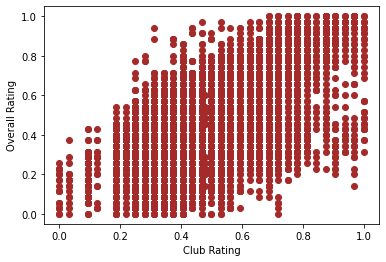

In [ ]:
plt.scatter(X_scaled_minmax[:, 2],y_scaled_minmax,color='brown')
plt.xlabel("Club Rating")
plt.ylabel("Overall Rating")
plt.show()

## Scaling - Standarization

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled_standard=scaler.fit_transform(X)
X_scaled_standard

array([[ 1.94895715,  0.38483287,  2.75716438],
       [ 2.40040236,  2.13170343,  1.75114123],
       [ 2.40040236,  2.21904696,  2.75716438],
       ...,
       [-1.54974327, -1.01266357, -0.05970044],
       [-0.98543675, -0.4886024 ,  0.94632271],
       [-0.87257545, -1.18735063,  0.34270882]])

In [ ]:
#reshape diperlukan untuk mengubah 1d array menjadi 2d array
y = y.reshape(-1,1)
y_scaled_standard=scaler.fit_transform(y)
print(y_scaled_standard)

[[ 2.65258318]
 [ 2.65258318]
 [ 2.65258318]
 ...
 [-1.06659699]
 [-1.06659699]
 [-1.06659699]]


### Visualisasi Sebaran setelah di Standarisasi

Reactions - Overall Rating

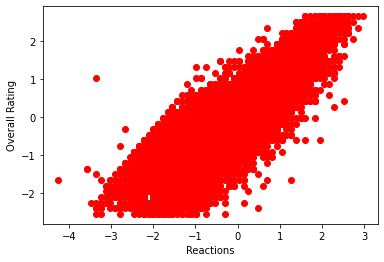

In [ ]:
plt.scatter(X_scaled_standard[:, 0],y_scaled_standard,color='red')
plt.xlabel("Reactions")
plt.ylabel("Overall Rating")
plt.show()

Composure - Overall Rating

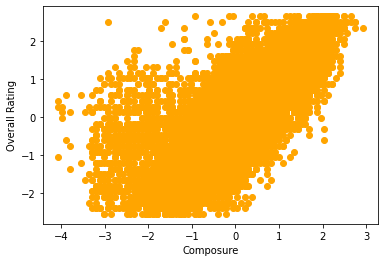

In [ ]:
plt.scatter(X_scaled_standard[:, 1],y_scaled_standard,color='orange')
plt.xlabel("Composure")
plt.ylabel("Overall Rating")
plt.show()

Club Rating - Overall Rating

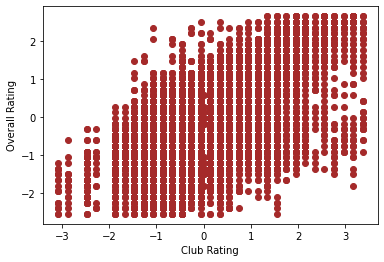

In [ ]:
plt.scatter(X_scaled_standard[:, 2],y_scaled_standard,color='brown')
plt.xlabel("Club Rating")
plt.ylabel("Overall Rating")
plt.show()

## Pemodelan

Untuk pemodelan kami menggunakan scaling - normalization

Sebelum masuk ke pemodelan, perlu dilakukan pembagian data menjadi data latih (training) dan data coba (test).

In [ ]:
#Membagi data test dan training
from sklearn.model_selection import train_test_split
train_x, test_x, train_y, test_y = train_test_split(X_scaled_minmax, y_scaled_minmax, test_size=0.33, random_state=None)
train_x.shape, test_x.shape, train_y.shape,test_y .shape

### Linear Regression - Jamak

In [ ]:
from sklearn import linear_model
regr=linear_model.LinearRegression()
regr.fit(train_x, train_y)
print('Coefficients: ', regr.coef_)
print('Intercept: ', regr.intercept_)

Coefficients:  [[0.79225191 0.3400507  0.27011965]]
Intercept:  [-0.30329121]


Visualisasi

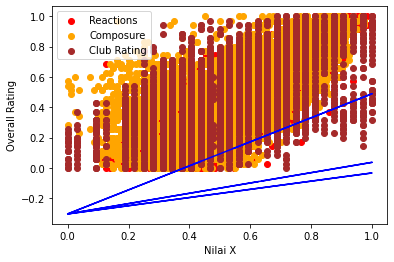

In [ ]:
plt.scatter(X_scaled_minmax[:, 0],y_scaled_minmax,color='red', label='Reactions')
plt.scatter(X_scaled_minmax[:, 1],y_scaled_minmax,color='orange', label='Composure')
plt.scatter(X_scaled_minmax[:, 2],y_scaled_minmax,color='brown', label='Club Rating')
plt.plot(train_x, regr.coef_*train_x + regr.intercept_,'b')
plt.xlabel("Nilai X")
plt.ylabel("Overall Rating")
plt.legend()
plt.show()

Evaluasi

In [ ]:
from sklearn import metrics
y_pred=regr.predict(test_x)
mae = metrics.mean_absolute_error(y_pred, test_y)
mse = metrics.mean_squared_error(y_pred, test_y)
rmse = np.sqrt(metrics.mean_squared_error(y_pred, test_y))
r2 = metrics.r2_score(y_pred, test_y)

print("Mean absolute error: %.2f" % mae)
print("Mean Squared Error (MSE): %.2f" % mse)
print("Root-Mean Squared Error (RMSE): %.2f" % rmse)
print("R2-score: %.2f" % r2)

Mean absolute error: 0.07
Mean Squared Error (MSE): 0.01
Root-Mean Squared Error (RMSE): 0.09
R2-score: 0.73


### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor(random_state=1)
dtree.fit(train_x, train_y)

y_pred = dtree.predict(test_x)

mae = metrics.mean_absolute_error(y_pred, test_y)
mse = metrics.mean_squared_error(y_pred, test_y)
rmse = np.sqrt(metrics.mean_squared_error(y_pred, test_y))
r2 = metrics.r2_score(y_pred, test_y)

print("Mean absolute error: %.2f" % mae)
print("Mean Squared Error (MSE): %.2f" % mse)
print("Root-Mean Squared Error (RMSE): %.2f" % rmse)
print("R2-score: %.2f" % r2)

Mean absolute error: 0.08
Mean Squared Error (MSE): 0.01
Root-Mean Squared Error (RMSE): 0.11
R2-score: 0.66


In [ ]:
!pip install graphviz

In [ ]:
from sklearn.tree import export_graphviz
import graphviz
# DOT data
dot_data = export_graphviz(dtree, out_file=None, feature_names=['reactions','composure','club_rating'],  
                                filled=True)

# Draw graph
graph =graphviz.Source(dot_data, format="png") 
graph

### Random Forest Regression

In [ ]:
# Fitting Random Forest Regression to the dataset
from sklearn.ensemble import RandomForestRegressor
rf_regressor = RandomForestRegressor(n_estimators = 100)
rf_regressor.fit(train_x, train_y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


RandomForestRegressor()

In [ ]:
# Predicting Test Set
y_pred = rf_regressor.predict(test_x)
from sklearn import metrics
mae = metrics.mean_absolute_error(test_y, y_pred)
mse = metrics.mean_squared_error(test_y, y_pred)
rmse = np.sqrt(metrics.mean_squared_error(test_y, y_pred))
r2 = metrics.r2_score(test_y, y_pred)

print("Mean absolute error: %.2f" % mae)
print("Mean Squared Error (MSE): %.2f" % mse)
print("Root-Mean Squared Error (RMSE): %.2f" % rmse)
print("R2-score: %.2f" % r2)

Mean absolute error: 0.07
Mean Squared Error (MSE): 0.01
Root-Mean Squared Error (RMSE): 0.09
R2-score: 0.77


### Support Vector Regression

In [ ]:
# Fitting SVR to the dataset
from sklearn.svm import SVR
sv_regressor = SVR(kernel = 'linear')
#linear = Linear Kernel
sv_regressor.fit(train_x, train_y)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR(kernel='linear')

In [ ]:
# Predicting Test Set
y_pred = sv_regressor.predict(test_x)
from sklearn import metrics
mae = metrics.mean_absolute_error(test_y, y_pred)
mse = metrics.mean_squared_error(test_y, y_pred)
rmse = np.sqrt(metrics.mean_squared_error(test_y, y_pred))
r2 = metrics.r2_score(test_y, y_pred)

print("Mean absolute error: %.2f" % mae)
print("Mean Squared Error (MSE): %.2f" % mse)
print("Root-Mean Squared Error (RMSE): %.2f" % rmse)
print("R2-score: %.2f" % r2)

Mean absolute error: 0.07
Mean Squared Error (MSE): 0.01
Root-Mean Squared Error (RMSE): 0.09
R2-score: 0.79


model compare

# Kesimpulan

Berdasarkan hasil penelitian, peneliti melakukan beberapa kali pengulangan evaluasi karena peneliti mengatur “random state” dalam posisi default. Dari beberapa kali pengulangan tersebut terjadi beberapa perubahan dari yang awalnya Support Vector Regression dengan hasil evaluasi terbesar lalu berubah menjadi Random Forest Regression dengan nilai evaluasi tertinggi. Oleh karena itu Random Forest Regression merupakan algoritma terbaik diantara algoritma lainnya. Random Forest Regression menghasilkan nilai evaluasi tertinggi. Didapatkan nilai sebesar 5% untuk MAE, 0% untuk MSE, 7% untuk RMSE, dan 88% untuk nilai R Square.
